<a href="https://colab.research.google.com/github/Maryemelb/prevision_de_demande_energitique_lstm/blob/main/prediction_de_consomation_energitique.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [15]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [16]:
import os
os.listdir('/content/drive/MyDrive/Colab Notebooks')

['distrubution_energetique.csv', 'prediction de consomation energitique']

In [17]:
import pandas as pd
data = pd.read_csv(
    '/content/drive/MyDrive/Colab Notebooks/distrubution_energetique.csv'
)
data.head(30)

,DateTime,Consumption,Production,Nuclear,Wind,Hydroelectric,Oil and Gas,Coal,Solar,Biomass
0,2019-01-01 00:00:00,6352,6527,1395,79,1383,1896,1744,0,30
1,2019-01-01 01:00:00,6116,5701,1393,96,1112,1429,1641,0,30
2,2019-01-01 02:00:00,5873,5676,1393,142,1030,1465,1616,0,30
3,2019-01-01 03:00:00,5682,5603,1397,191,972,1455,1558,0,30
4,2019-01-01 04:00:00,5557,5454,1393,159,960,1454,1458,0,30
5,2019-01-01 05:00:00,5525,5385,1395,91,958,1455,1456,0,30
6,2019-01-01 06:00:00,5513,5349,1392,98,938,1451,1440,0,31
7,2019-01-01 07:00:00,5524,5547,1392,93,1187,1446,1394,0,34
8,2019-01-01 08:00:00,5510,5471,1391,51,1325,1357,1303,8,34
9,2019-01-01 09:00:00,5617,5545,1388,15,1398,1328,1319,61,34


In [18]:
data.shape

(54170, 10)

In [19]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54170 entries, 0 to 54169
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   DateTime       54170 non-null  object
 1   Consumption    54170 non-null  int64 
 2   Production     54170 non-null  int64 
 3   Nuclear        54170 non-null  int64 
 4   Wind           54170 non-null  int64 
 5   Hydroelectric  54170 non-null  int64 
 6   Oil and Gas    54170 non-null  int64 
 7   Coal           54170 non-null  int64 
 8   Solar          54170 non-null  int64 
 9   Biomass        54170 non-null  int64 
dtypes: int64(9), object(1)
memory usage: 4.1+ MB


In [20]:
pd.set_option('display.max_rows', None)
data[data.duplicated()]

,DateTime,Consumption,Production,Nuclear,Wind,Hydroelectric,Oil and Gas,Coal,Solar,Biomass
7180,2019-10-27 03:00:00,5196,4459,1373,74,725,719,1515,0,50
15917,2020-10-25 03:00:00,5220,5412,1418,1188,1098,594,1048,0,65
24822,2021-10-31 03:00:00,5341,5258,1415,141,934,1314,1393,0,58
33559,2022-10-30 03:00:00,4503,5269,1384,544,1289,924,1073,0,52


In [21]:
data= data.drop_duplicates()

In [22]:
data.shape

(54166, 10)

In [23]:
data.isnull().sum()

,0
DateTime,0
Consumption,0
Production,0
Nuclear,0
Wind,0
Hydroelectric,0
Oil and Gas,0
Coal,0
Solar,0
Biomass,0


**Matrice de correlation**

<Axes: >

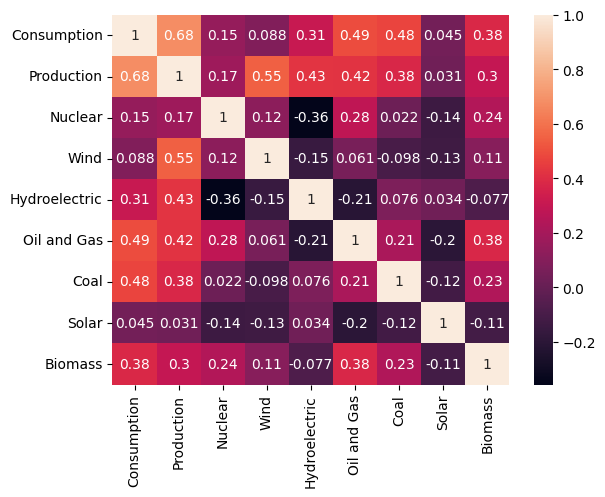

In [24]:
import seaborn as sns
corr= data.select_dtypes(include='int64').corr()
sns.heatmap(corr, annot=True)

In [29]:
import matplotlib.pyplot as plt
plt.plot(data['DateTime'], data['Consumption'])
plt.show()

KeyboardInterrupt: 

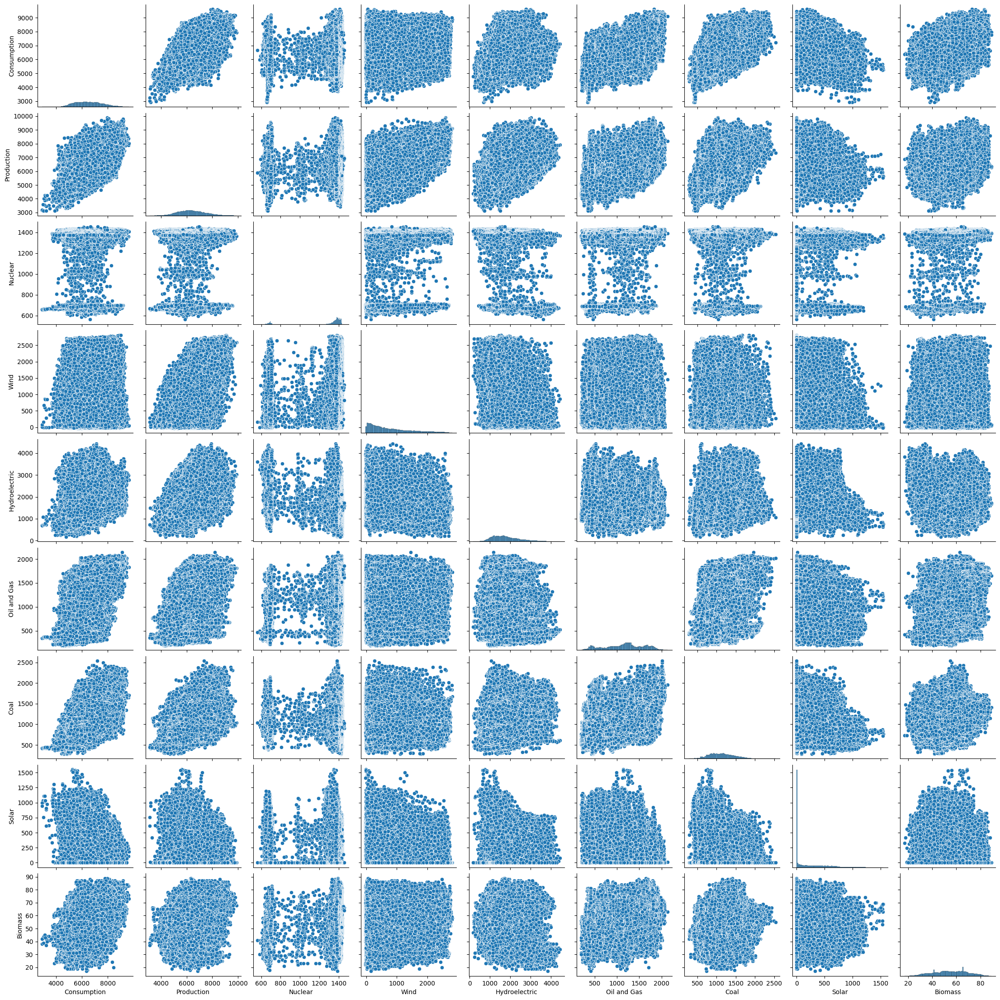

In [26]:
#data distribution
import seaborn as sns
import matplotlib.pyplot as plt
numeric_data= data.select_dtypes(include='int64')
sns.pairplot(numeric_data)
plt.show()


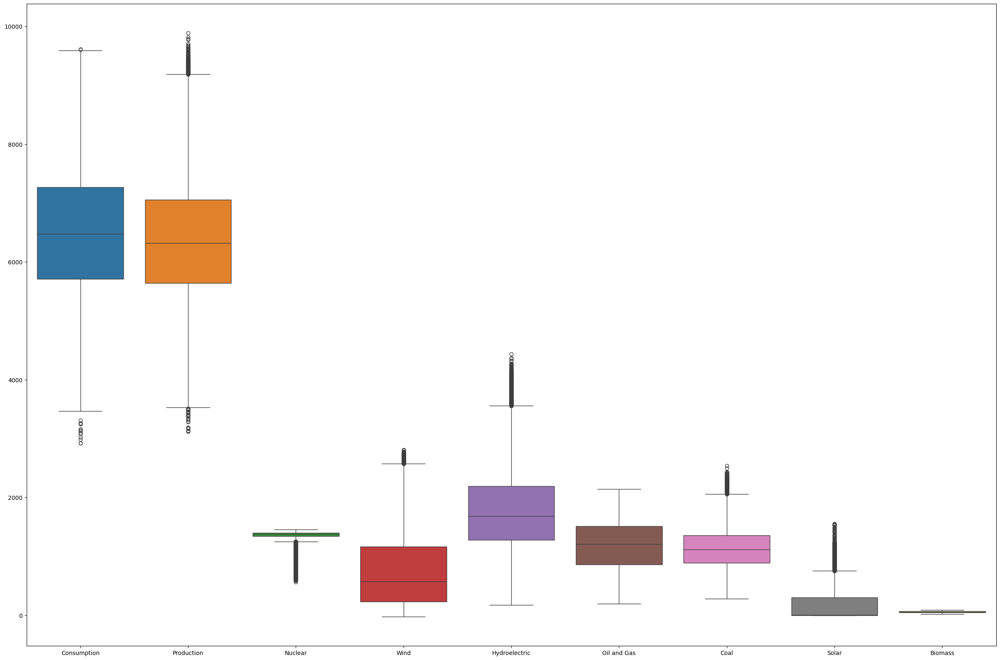

In [27]:

numeric_data= data.select_dtypes(include='int64')
plt.figure(figsize=(30,20))
sns.boxplot(numeric_data)
plt.show()

**handle the outliers**

In [28]:
import numpy as np
q1_list= {}
q3_list = {}
iqr_list= {}
lower_bound= {}
uper_bound= {}

numeric_data= data.select_dtypes(include='int64').drop(columns='Consumption')

for col in numeric_data.columns:
  q1_list[col]=np.percentile(numeric_data[col], 25)
  q3_list[col]=np.percentile(numeric_data[col], 75)
  iqr_list[col]=q3_list[col]- q1_list[col]
  lower_bound[col]= q1_list[col] -( 1.5 * iqr_list[col])
  uper_bound[col]= q3_list[col] +( 1.5 * iqr_list[col])

print(q1_list)
print(q3_list)
print(iqr_list)
print(lower_bound)
print(uper_bound)


{'Production': np.float64(5640.0), 'Nuclear': np.float64(1341.0), 'Wind': np.float64(228.0), 'Hydroelectric': np.float64(1281.0), 'Oil and Gas': np.float64(860.0), 'Coal': np.float64(890.0), 'Solar': np.float64(0.0), 'Biomass': np.float64(45.0)}
{'Production': np.float64(7058.0), 'Nuclear': np.float64(1400.0), 'Wind': np.float64(1167.0), 'Hydroelectric': np.float64(2191.0), 'Oil and Gas': np.float64(1510.0), 'Coal': np.float64(1358.0), 'Solar': np.float64(302.0), 'Biomass': np.float64(65.0)}
{'Production': np.float64(1418.0), 'Nuclear': np.float64(59.0), 'Wind': np.float64(939.0), 'Hydroelectric': np.float64(910.0), 'Oil and Gas': np.float64(650.0), 'Coal': np.float64(468.0), 'Solar': np.float64(302.0), 'Biomass': np.float64(20.0)}
{'Production': np.float64(3513.0), 'Nuclear': np.float64(1252.5), 'Wind': np.float64(-1180.5), 'Hydroelectric': np.float64(-84.0), 'Oil and Gas': np.float64(-115.0), 'Coal': np.float64(188.0), 'Solar': np.float64(-453.0), 'Biomass': np.float64(15.0)}
{'Produ

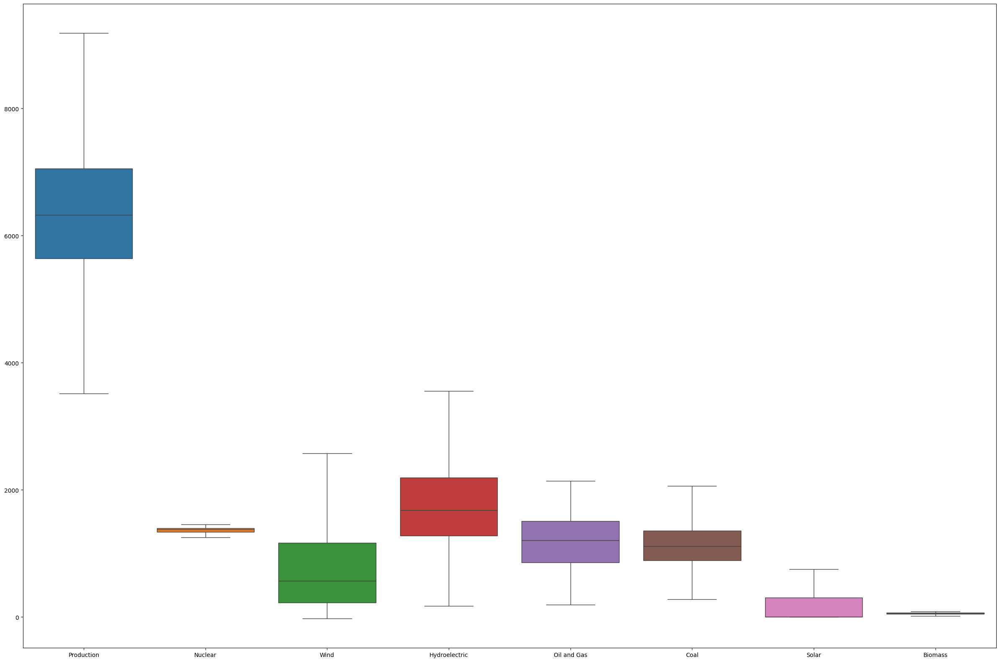

In [31]:
#retrieve outliers
#handle outliers using IQR methode

for col in numeric_data.columns:
    numeric_data[col]= np.where(numeric_data[col]> uper_bound[col], uper_bound[col], numeric_data[col])
    numeric_data[col]= np.where(numeric_data[col]< lower_bound[col], lower_bound[col], numeric_data[col])

plt.figure(figsize=(30,20))
sns.boxplot(numeric_data)
plt.show()


In [32]:
df= pd.DataFrame(data)

#update all numerique data in the dataframe
df[numeric_data.columns]= numeric_data
df['DateTime']= pd.to_datetime(df['DateTime'])
df= df.sort_values('DateTime')
#The DateTime column becomes the row index
df.set_index("DateTime", inplace=True)
df.head()

,Consumption,Production,Nuclear,Wind,Hydroelectric,Oil and Gas,Coal,Solar,Biomass
DateTime,,,,,,,,,
2019-01-01 00:00:00,6352,6527.0,1395.0,79.0,1383.0,1896.0,1744.0,0.0,30.0
2019-01-01 01:00:00,6116,5701.0,1393.0,96.0,1112.0,1429.0,1641.0,0.0,30.0
2019-01-01 02:00:00,5873,5676.0,1393.0,142.0,1030.0,1465.0,1616.0,0.0,30.0
2019-01-01 03:00:00,5682,5603.0,1397.0,191.0,972.0,1455.0,1558.0,0.0,30.0
2019-01-01 04:00:00,5557,5454.0,1393.0,159.0,960.0,1454.0,1458.0,0.0,30.0


**Pourquoi l’ordre temporel est critique**

Les LSTM se basent sur **l’ordre séquentiel** des données.

- Si les données ne sont pas correctement ordonnées, le modèle ne pourra pas apprendre correctement les dépendances temporelles.

- Par exemple, pour prédire la consommation électrique totale en se basant sur les 24 dernières heures, il est obligatoire que les données soient triées par date de manière croissante.

- Les valeurs des jours précédents sont alors stockées dans la mémoire à long terme du LSTM pour influencer les prédictions futures.

**Pourquoi on ne mélange pas les données (pas de shuffle)**

- Si on utilise shuffle=True, les données sont mélangées à chaque batch, ce qui change l’ordre des données.
- Dans notre cas, l’ordre temporel est important, car on utilise les cas précédents pour prédire les cas suivants.
La meilleure solution est donc shuffle=False pour préserver la séquence.

- Pour des données indépendantes (images, clients, tableaux classiques), l’utilisation de shuffle=True peut être une bonne solution, car le mélange des données peut être utile et améliore la généralisation du modèle.

**Normalisation**

**Pourquoi la normalisation est indispensable en Deep Learning**

 **1.** Accélère l’entraînement

La normalisation met toutes les valeurs sur une échelle similaire (souvent 0‑1 ou moyenne 0 / écart type 1), ce qui aide le réseau à apprendre plus rapidement.

**2.** Améliore la précision et la stabilité

Les réseaux de neurones sont sensibles aux grandes différences d’échelle.

Sans normalisation, certaines features peuvent dominer la mise à jour des poids, ce qui peut donner des résultats moins précis ou instables.

**3.** Évite certains problèmes numériques

Avec des valeurs très grandes, certaines fonctions d’activation (sigmoid, tanh) peuvent saturer

In [33]:
from sklearn.preprocessing import MinMaxScaler
# df.head()
scaler = MinMaxScaler()
scaleddata = scaler.fit_transform(df)
scaled_data= pd.DataFrame(scaleddata, columns=df.columns, index=df.index)
scaled_data.head()

,Consumption,Production,Nuclear,Wind,Hydroelectric,Oil and Gas,Coal,Solar,Biomass
DateTime,,,,,,,,,
2019-01-01 00:00:00,0.512476,0.531382,0.696822,0.040361,0.357291,0.874101,0.822572,0.0,0.180556
2019-01-01 01:00:00,0.477215,0.385755,0.687042,0.046896,0.277137,0.634121,0.764739,0.0,0.180556
2019-01-01 02:00:00,0.440908,0.381347,0.687042,0.064578,0.252884,0.652621,0.750702,0.0,0.180556
2019-01-01 03:00:00,0.412371,0.368477,0.706601,0.083413,0.235729,0.647482,0.718136,0.0,0.180556
2019-01-01 04:00:00,0.393695,0.342207,0.687042,0.071113,0.232180,0.646968,0.661988,0.0,0.180556


**create Sequentiel data**

In [37]:
import numpy as np
def createSequentiel(data, Window):
     print(data)
     X= []
     y= []
     for i in range(Window, len((scaled_data))):
        X.append(scaled_data.iloc[i-Window : i].drop(columns='Consumption')) #all cols except Consumption
        y.append(scaled_data['Consumption'].iloc[i])
     return np.array(X), np.array(y)
X,y = createSequentiel(scaled_data, Window=24)



                     Consumption  Production   Nuclear      Wind  \
DateTime                                                           
2019-01-01 00:00:00     0.512476    0.531382  0.696822  0.040361   
2019-01-01 01:00:00     0.477215    0.385755  0.687042  0.046896   
2019-01-01 02:00:00     0.440908    0.381347  0.687042  0.064578   
2019-01-01 03:00:00     0.412371    0.368477  0.706601  0.083413   
2019-01-01 04:00:00     0.393695    0.342207  0.687042  0.071113   
2019-01-01 05:00:00     0.388914    0.330042  0.696822  0.044974   
2019-01-01 06:00:00     0.387121    0.323695  0.682152  0.047665   
2019-01-01 07:00:00     0.388764    0.358604  0.682152  0.045743   
2019-01-01 08:00:00     0.386673    0.345205  0.677262  0.029598   
2019-01-01 09:00:00     0.402659    0.358251  0.662592  0.015760   
2019-01-01 10:00:00     0.406544    0.369711  0.672372  0.008072   
2019-01-01 11:00:00     0.420589    0.391396  0.672372  0.003460   
2019-01-01 12:00:00     0.426416    0.406030  0.